<a href="https://colab.research.google.com/github/cppel/dz/blob/main/Task8_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа №8. Генеративно-состязательная сеть (GAN). Часть 2**

[**Ссылка на код с пары**](https://colab.research.google.com/drive/1EjuztcsVONI_UWWTJYIVvREiDHGSxduE?usp=sharing)


[**Ссылка на техническую документацию**](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ru)

# Примечание:

Не забывайте периодически сохранять параметры модели. Функции для этого описаны в теоретической части. В случае приостановки процесса обучения из-за перегрузки ОЗУ, Вы сможете загрузить последние предобученные параметры и продолжить обучение.

# **Задание №1.** Обучите генератор воспризводить примитивные изображения по заданному условию (Conditional Generative Adversarial Nets (CGAN)). 

(На вход генератора подается вектор случайного шума и метка класса - на выходе должно получиться изображение, соответствующее данному классу)

Датасет выберите по желанию. ([Пример](https://www.kaggle.com/datasets/sagyamthapa/handwritten-math-symbols))

In [ ]:
from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from keras.models import Model
from keras.layers import BatchNormalization, Input, Dense, Reshape, Flatten, Conv2D, Conv2DTranspose, LeakyReLU, Dropout, Embedding, Concatenate

from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from imutils import paths
from tqdm.notebook import tqdm
import random 
import cv2
import os
import numpy as np
import h5py

In [ ]:
def load_data():
	images = np.load('./faces_imgs.npy')
	labels = np.load('./faces_imgs_labels.npy')
    
	lb = LabelEncoder()
	labels = lb.fit_transform(labels)

	return (images, labels)


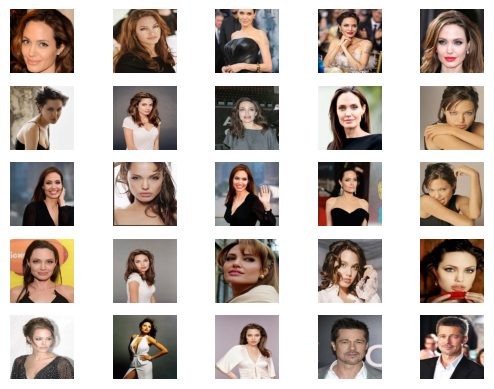

In [ ]:
(trainX, trainy) = load_data()

# plot 25 images
for i in range(25):
	plt.subplot(5, 5, 1 + i)
	plt.axis('off')
	plt.imshow(cv2.cvtColor(trainX[i], cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
def define_discriminator(in_shape=(256,256,3), n_classes=10):
	in_label = Input(shape=(1,))
	li = Embedding(n_classes, 50)(in_label) 

	n_nodes = in_shape[0] * in_shape[1]
	li = Dense(n_nodes)(li)
	li = Reshape((in_shape[0], in_shape[1], 1))(li)  #32x32x1
    
    
	in_image = Input(shape=in_shape) #32x32x3
	merge = Concatenate()([in_image, li])
    
	fe = LeakyReLU(alpha=0.2)(merge)
	fe = Conv2D(128, (3,3), strides=(2,2), padding='same')(fe) #8x8x128
	fe = LeakyReLU(alpha=0.2)(fe)
	fe = Flatten()(fe)
	fe = Dropout(0.4)(fe)
	out_layer = Dense(1, activation='sigmoid')(fe)
    
	model = Model([in_image, in_label], out_layer)
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
	return model

test_discr = define_discriminator()
print(test_discr.summary())

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_45 (InputLayer)          [(None, 1)]          0           []                               
                                                                                                  
 embedding_22 (Embedding)       (None, 1, 50)        500         ['input_45[0][0]']               
                                                                                                  
 dense_41 (Dense)               (None, 1, 65536)     3342336     ['embedding_22[0][0]']           
                                                                                                  
 input_46 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                         

c:\Users\flexl\anaconda3\envs\keras\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
def define_generator(latent_dim, n_classes=10):
    
	in_label = Input(shape=(1,))
	li = Embedding(n_classes, 50)(in_label)
    
	n_nodes = 64 * 64
	li = Dense(n_nodes)(li) #1,64
	li = Reshape((64, 64, 1))(li)
    
    
	in_lat = Input(shape=(latent_dim,))
    

	n_nodes = 16 * 64 * 64
	gen = Dense(n_nodes)(in_lat)
	gen = LeakyReLU(alpha=0.2)(gen)
	gen = Reshape((64, 64, 16))(gen)
	merge = Concatenate()([gen, li])
	gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(merge) #16x16x128
	gen = LeakyReLU(alpha=0.2)(gen)
	gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(gen) #32x32x128
	gen = LeakyReLU(alpha=0.2)(gen)
	out_layer = Conv2D(3, (8,8), activation='tanh', padding='same')(gen) #32x32x3
	model = Model([in_lat, in_label], out_layer)
	return model

test_gen = define_generator(100, n_classes=10)
print(test_gen.summary())


Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_44 (InputLayer)          [(None, 100)]        0           []                               
                                                                                                  
 input_43 (InputLayer)          [(None, 1)]          0           []                               
                                                                                                  
 dense_40 (Dense)               (None, 65536)        6619136     ['input_44[0][0]']               
                                                                                                  
 embedding_21 (Embedding)       (None, 1, 50)        500         ['input_43[0][0]']               
                                                                                           

In [ ]:
def define_gan(g_model, d_model):
  d_model.trainable = False  
    
  gen_noise, gen_label = g_model.input 
  gen_output = g_model.output 
    
  gan_output = d_model([gen_output, gen_label])
  model = Model([gen_noise, gen_label], gan_output)

  opt = Adam(lr=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt)
  return model

In [ ]:
def load_real_samples():

	(trainX, trainy) = load_data() 

	X = trainX.astype('float32')
	X = (X - 127.5) / 127.5 
                           
	return [X, trainy]

In [ ]:
def generate_real_samples(dataset, n_samples):
  images, labels = dataset  
  ix = randint(0, images.shape[0], n_samples)
  X, labels = images[ix], labels[ix]
  y = ones((n_samples, 1))
  return [X, labels], y

In [ ]:
def generate_latent_points(latent_dim, n_samples, n_classes=10):
	x_input = randn(latent_dim * n_samples)
	z_input = x_input.reshape(n_samples, latent_dim)
	labels = randint(0, n_classes, n_samples)
	return [z_input, labels]

In [ ]:
# Для генерации случайного шума используется функция, описанная выше 
def generate_fake_samples(generator, latent_dim, n_samples):
	z_input, labels_input = generate_latent_points(latent_dim, n_samples)
	images = generator.predict([z_input, labels_input], verbose=0)
	y = zeros((n_samples, 1))  #Label=0 указывает на то, что они поддельные
	return [images, labels_input], y

In [ ]:
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=256):
	bat_per_epo = int(dataset[0].shape[0] / n_batch)
	half_batch = int(n_batch / 2)
    
	epoch_progress = tqdm(total=n_epochs)
	batch_progress = tqdm(total=bat_per_epo)
    
	for i in range(n_epochs): 
		for j in range(bat_per_epo): 
			[X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)

			d_loss_real, _ = d_model.train_on_batch([X_real, labels_real], y_real)
            
			[X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
			d_loss_fake, _ = d_model.train_on_batch([X_fake, labels], y_fake)
            
            
			[z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
            
			y_gan = ones((n_batch, 1))

			g_loss = gan_model.train_on_batch([z_input, labels_input], y_gan)
            
			status = 'Epoch>%d, Batch%d/%d, d1=%.3f, d2=%.3f g=%.3f' % (i+1, j+1, bat_per_epo, d_loss_real, d_loss_fake, g_loss)
			batch_progress.set_description_str(status)
			batch_progress.update(1)
		epoch_progress.update(1)
		batch_progress.reset()

In [ ]:
latent_dim = 100
d_model = define_discriminator()
g_model = define_generator(latent_dim)
gan_model = define_gan(g_model, d_model)
dataset = load_real_samples()

In [ ]:
train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=16)

In [ ]:
g_model.save(r'faces_1000.h5')

### Демонстрация сгенерированных изображений:

In [ ]:
from numpy import asarray
from numpy.random import randn
from numpy.random import randint
from keras.models import load_model
import numpy as np

In [ ]:
model = load_model(r'faces_1000.h5')

4/4 [==============================] - 1s 326ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

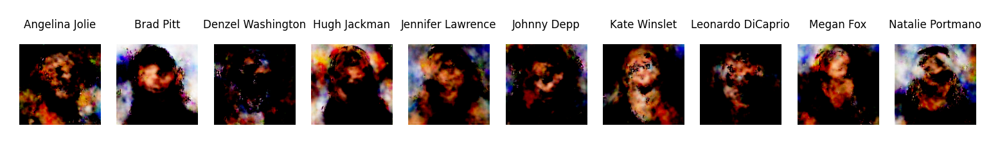

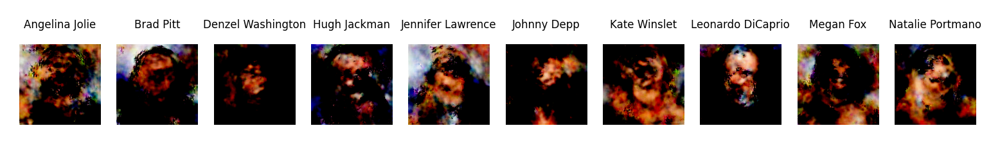

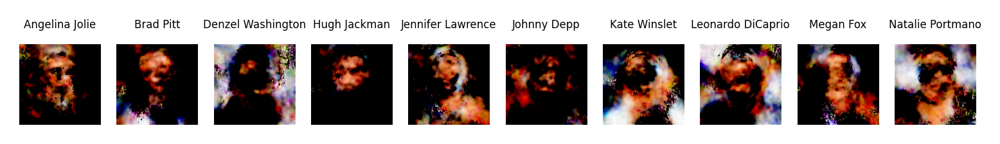

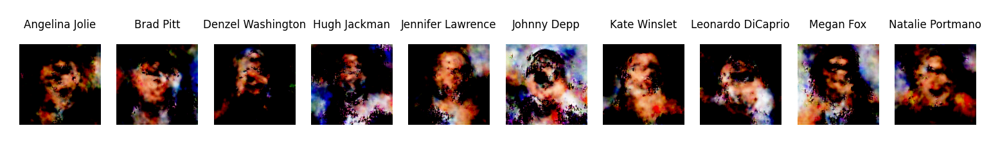

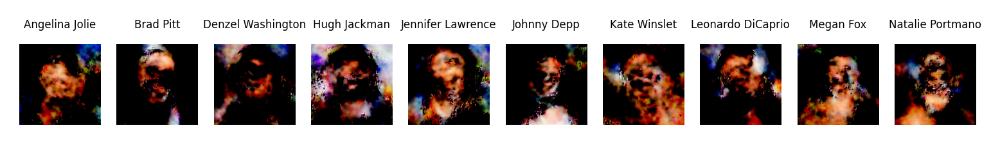

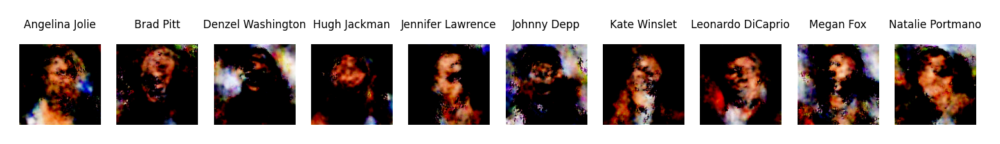

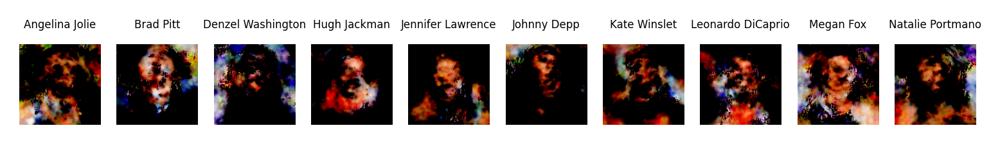

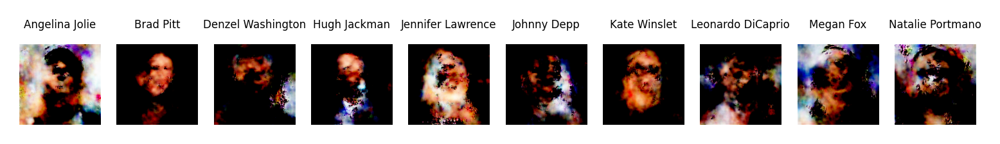

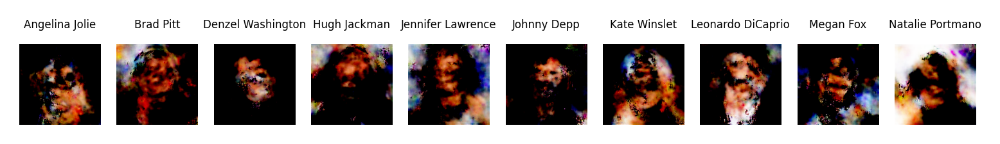

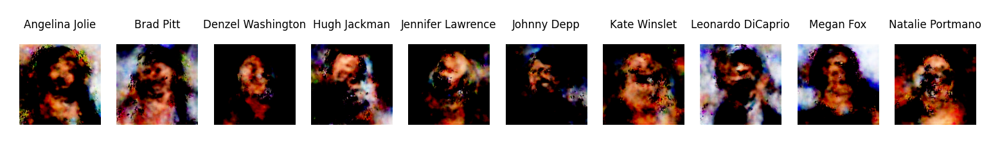

In [ ]:
latent_points, labels = generate_latent_points(100, 100)
labels = asarray([x for _ in range(10) for x in range(10)])

label_desc = {
    0: 'Angelina Jolie',
    1: 'Brad Pitt',
    2: 'Denzel Washington',
    3: 'Hugh Jackman',
    4: 'Jennifer Lawrence',
    5: 'Johnny Depp',
    6: 'Kate Winslet',
    7: 'Leonardo DiCaprio',
    8: 'Megan Fox',
    9: 'Natalie Portmano'
}

# Генерируем изображения
X = g_model.predict([latent_points, labels])

cnt = 0
for i in range(10):
    fig, axs = plt.subplots(1, 10, dpi=300)
    for j in range(10):
        img = cv2.cvtColor(X[cnt], cv2.COLOR_BGR2RGB)
        axs[j].imshow(img)
        axs[j].set_title(label_desc[j], fontsize=4)
        axs[j].axis('off')
        cnt += 1	
    fig.show()
    fig.savefig('')

# **Задание №2.** Обучите генератор воспризводить **спутниковый снимок** по **загруженной маске** (pix2pix). Используйте для этого разделенный на патчи датасет из практической работы №7 ([Ссылка на датасет](https://www.kaggle.com/datasets/humansintheloop/semantic-segmentation-of-aerial-imagery))

In [ ]:
from numpy import zeros
from numpy import ones
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from matplotlib import pyplot as plt
from tensorflow.keras.utils import plot_model

In [ ]:
def define_discriminator(image_shape):
    
	init = RandomNormal(stddev=0.02)
    
	in_src_image = Input(shape=image_shape)
	in_target_image = Input(shape=image_shape)
    
	merged = Concatenate()([in_src_image, in_target_image])
    
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	model = Model([in_src_image, in_target_image], patch_out)
    
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

In [ ]:
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	init = RandomNormal(stddev=0.02)
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	g = LeakyReLU(alpha=0.2)(g)
	return g

In [ ]:
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	init = RandomNormal(stddev=0.02)
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	g = BatchNormalization()(g, training=True)
	if dropout:
		g = Dropout(0.5)(g, training=True)
	g = Concatenate()([g, skip_in])
	g = Activation('relu')(g)
	return g

In [ ]:
def define_generator(image_shape=(256,256,3)):
	init = RandomNormal(stddev=0.02)
	in_image = Input(shape=image_shape)
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('tanh')(g)
	model = Model(in_image, out_image)
	return model

In [ ]:
def define_generator(image_shape=(256,256,3)):
	init = RandomNormal(stddev=0.02)
	in_image = Input(shape=image_shape)
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('tanh')(g)
	model = Model(in_image, out_image)
	return model

In [ ]:
def define_gan(g_model, d_model, image_shape):
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False 
            
	in_src = Input(shape=image_shape)
	gen_out = g_model(in_src)
	dis_out = d_model([in_src, gen_out])
	model = Model(in_src, [dis_out, gen_out])
	opt = Adam(lr=0.0002, beta_1=0.5)
    
	model.compile(loss=['binary_crossentropy', 'mae'], 
               optimizer=opt, loss_weights=[1,100])
	return model

In [ ]:
def generate_real_samples(dataset, n_samples, patch_shape):
	trainA, trainB = dataset
	ix = randint(0, trainA.shape[0], n_samples)
	X1, X2 = trainA[ix], trainB[ix]
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return [X1, X2], y

In [ ]:
def generate_fake_samples(g_model, samples, patch_shape):
	X = g_model.predict(samples)
	y = zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

In [ ]:
def summarize_performance(step, g_model, dataset, n_samples=3):
	[X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
	X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
	X_realA = (X_realA + 1) / 2.0
	X_realB = (X_realB + 1) / 2.0
	X_fakeB = (X_fakeB + 1) / 2.0

	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + i)
		plt.axis('off')
		plt.imshow(X_realA[i])

	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples + i)
		plt.axis('off')
		plt.imshow(X_fakeB[i])

	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples*2 + i)
		plt.axis('off')
		plt.imshow(X_realB[i])

	filename1 = 'plot_%06d.png' % (step+1)
	plt.savefig(os.path.join(r'C:\Users\work\Downloads\models_task8_2\segmentation', filename1))
	plt.close()

	filename2 = 'model_%06d.h5' % (step+1)
	g_model.save(os.path.join(r'C:\Users\work\Downloads\models_task8_2', filename2))
	print('>Saved: %s and %s' % (filename1, filename2))

In [ ]:
def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=1):
	n_patch = d_model.output_shape[1]
	trainA, trainB = dataset
	bat_per_epo = int(len(trainA) / n_batch)
	n_steps = bat_per_epo * n_epochs
	for i in range(n_steps):
		[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
		X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
		d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
		d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
		g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
		print(f'Эпоха: {((i+1) // bat_per_epo) + 1}')
		print('Итерация: %d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
		if (i+1) % (bat_per_epo * 1) == 0: # Сохраняем модель генератора и набор изображений каждую (1) эпоху. 
			summarize_performance(i, g_model, dataset)

In [ ]:
from os import listdir
from numpy import asarray, load
from numpy import vstack
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import load_img
from numpy import savez_compressed
from matplotlib import pyplot
import numpy as np
import os

In [ ]:
def load_images(images_path,  mask_path, size=(256,256)):
	src_list, tar_list = list(), list()
	for filename in listdir(images_path):      
		mask_pixels = load_img(os.path.join(mask_path, os.path.splitext(filename)[0]+'.png'), target_size=size)
		mask = img_to_array(mask_pixels)

		img_pixels = load_img(os.path.join(images_path, filename), target_size=size)
		img = img_to_array(img_pixels)
	       
		src_list.append(mask)
		tar_list.append(img)

	return [asarray(src_list), asarray(tar_list)]

In [ ]:
img_path = r'C:\Users\work\Downloads\task7_1_dataset\train_image\train'
mask_path = r'C:\Users\work\Downloads\task7_1_dataset\train_mask\train'
[src_images, tar_images] = load_images(img_path, mask_path)
print('Загружено: ', src_images.shape, tar_images.shape)

Загружено:  (789, 256, 256, 3) (789, 256, 256, 3)


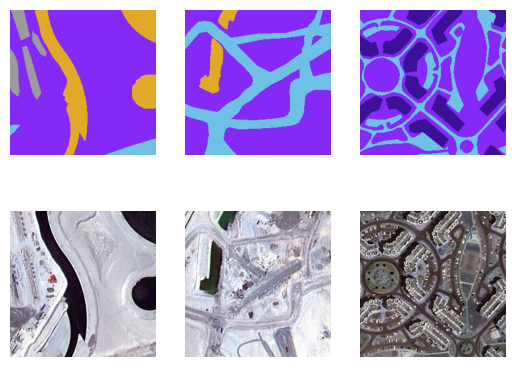

In [ ]:
n_samples = 3
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + i)
	pyplot.axis('off')
	pyplot.imshow(src_images[i].astype('uint8'))

for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + n_samples + i)
	pyplot.axis('off')
	pyplot.imshow(tar_images[i].astype('uint8'))
pyplot.show()

In [ ]:
data = [src_images, tar_images]

In [ ]:
image_shape = src_images.shape[1:]

d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
gan_model = define_gan(g_model, d_model, image_shape)

In [ ]:
def preprocess_data(data): 
	mask, img = data[0], data[1]
	
	mask = (mask - 127.5) / 127.5
	img = (img - 127.5) / 127.5
	
	return [mask, img]

dataset = preprocess_data(data)

In [ ]:
n_epochs = 100

In [ ]:
import tensorflow as tf
tf.config.run_functions_eagerly(True) 

In [ ]:
from datetime import datetime 

start1 = datetime.now() 

train(d_model, g_model, gan_model, dataset, n_epochs=n_epochs, n_batch=1) 

stop1 = datetime.now()

execution_time = stop1-start1
print("Время обучения модели: ", execution_time, f"(\nОдна эпоха: {(execution_time/n_epochs).total_seconds()/60} минут)")

C:\Users\work\anaconda3\envs\gpu\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


Эпоха: 1
Итерация: 1, d1[0.667] d2[0.508] g[61.529]
Эпоха: 1
Итерация: 2, d1[0.526] d2[0.563] g[40.921]
Эпоха: 1
Итерация: 3, d1[0.538] d2[0.454] g[42.901]
Эпоха: 1
Итерация: 4, d1[0.496] d2[0.594] g[48.035]
Эпоха: 1
Итерация: 5, d1[0.670] d2[0.836] g[35.757]
Эпоха: 1
Итерация: 6, d1[0.451] d2[0.484] g[58.292]
Эпоха: 1
Итерация: 7, d1[0.476] d2[0.463] g[94.055]
Эпоха: 1
Итерация: 8, d1[0.539] d2[0.663] g[53.570]
Эпоха: 1
Итерация: 9, d1[0.507] d2[1.383] g[48.186]
Эпоха: 1
Итерация: 10, d1[0.729] d2[0.499] g[45.164]
Эпоха: 1
Итерация: 11, d1[0.466] d2[0.701] g[64.768]
Эпоха: 1
Итерация: 12, d1[0.512] d2[0.429] g[35.528]
Эпоха: 1
Итерация: 13, d1[0.394] d2[0.536] g[64.269]
Эпоха: 1
Итерация: 14, d1[0.396] d2[0.538] g[45.820]
Эпоха: 1
Итерация: 15, d1[0.567] d2[0.488] g[34.257]
Эпоха: 1
Итерация: 16, d1[0.495] d2[0.464] g[40.905]
Эпоха: 1
Итерация: 17, d1[0.436] d2[0.432] g[39.480]
Эпоха: 1
Итерация: 18, d1[0.385] d2[0.563] g[57.315]
Эпоха: 1
Итерация: 19, d1[0.322] d2[0.455] g[87.218]
Эп

In [ ]:
g_model.save(r'C:\Users\work\Downloads\models_task8_2\segmentation_model.h5')

### Демонстрация сгенерированных изображений:

In [ ]:
from keras.models import load_model
from numpy.random import randint

In [ ]:
model = load_model(r'C:\Users\work\Downloads\models_task8_2\segmentation_model.h5') 

In [ ]:
def plot_images(src_img, gen_img, tar_img):
	images = vstack((src_img, gen_img, tar_img))
	images = (images + 1) / 2.0
	titles = ['Исходное', 'Сгенерированное', 'Ожидаемое']
	for i in range(len(images)):
		pyplot.subplot(1, 3, 1 + i)
		pyplot.axis('off')
		pyplot.imshow(images[i])
		pyplot.title(titles[i])
	pyplot.show()

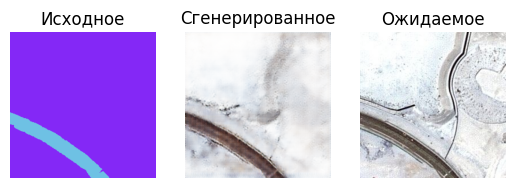

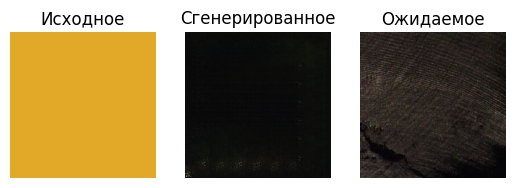

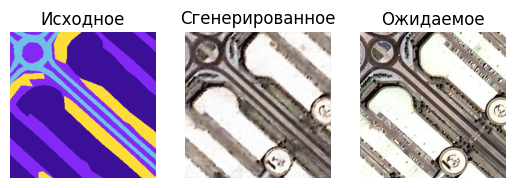

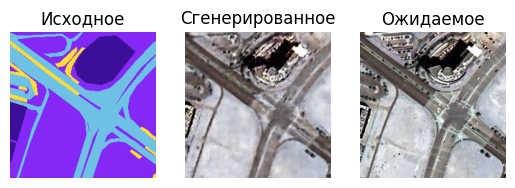

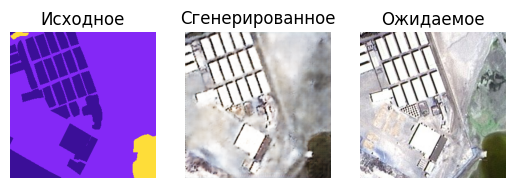

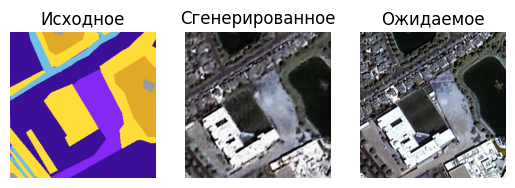

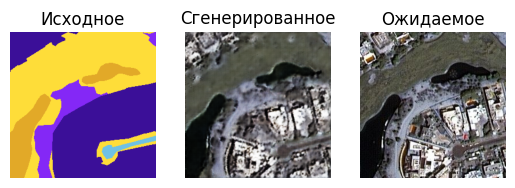

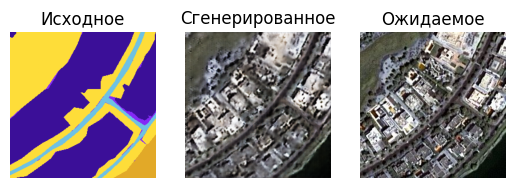

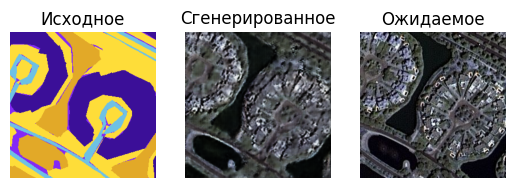

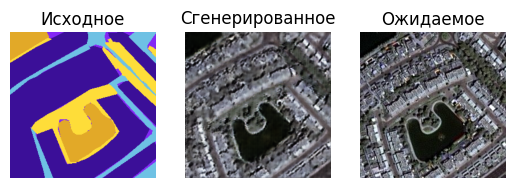

In [ ]:
[X1, X2] = dataset

for i in range(10):
  ix = randint(0, len(X1), 1)
  src_image, tar_image = X1[ix], X2[ix]
  gen_image = model.predict(src_image)
  plot_images(src_image, gen_image, tar_image)

# **Задание №3.** Обучите генератор воспроизводить изображения из выбранного Вами датасета (pix2pix). 

Датасет может быть сформирован Вами (например, черно-белые и цветные изображения) или найден в глобальной сети Интернет. 

Например [тут](https://www.kaggle.com/search?q=pix2pix+in%3Adatasets+datasetFileTypes%3Ajpg+datasetFileTypes%3Apng) или [тут](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/)

### Демонстрация сгенерированных изображений:

In [ ]:
from numpy import zeros
from numpy import ones
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from matplotlib import pyplot as plt
from tensorflow.keras.utils import plot_model

In [ ]:
def define_discriminator(image_shape):
    
	init = RandomNormal(stddev=0.02)
    
	in_src_image = Input(shape=image_shape)
	in_target_image = Input(shape=image_shape)
    
	merged = Concatenate()([in_src_image, in_target_image])
    
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	model = Model([in_src_image, in_target_image], patch_out)
    
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

In [ ]:
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	init = RandomNormal(stddev=0.02)
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	g = LeakyReLU(alpha=0.2)(g)
	return g

In [ ]:
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	init = RandomNormal(stddev=0.02)
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	g = BatchNormalization()(g, training=True)
	if dropout:
		g = Dropout(0.5)(g, training=True)
	g = Concatenate()([g, skip_in])
	g = Activation('relu')(g)
	return g

In [ ]:
def define_generator(image_shape=(256,256,3)):
	init = RandomNormal(stddev=0.02)
	in_image = Input(shape=image_shape)
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('tanh')(g)
	model = Model(in_image, out_image)
	return model

In [ ]:
def define_generator(image_shape=(256,256,3)):
	init = RandomNormal(stddev=0.02)
	in_image = Input(shape=image_shape)
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('tanh')(g)
	model = Model(in_image, out_image)
	return model

In [ ]:
def define_gan(g_model, d_model, image_shape):
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False 
            
	in_src = Input(shape=image_shape)
	gen_out = g_model(in_src)
	dis_out = d_model([in_src, gen_out])
	model = Model(in_src, [dis_out, gen_out])
	opt = Adam(lr=0.0002, beta_1=0.5)
    
	model.compile(loss=['binary_crossentropy', 'mae'], 
               optimizer=opt, loss_weights=[1,100])
	return model

In [ ]:
def generate_real_samples(dataset, n_samples, patch_shape):
	trainA, trainB = dataset
	ix = randint(0, trainA.shape[0], n_samples)
	X1, X2 = trainA[ix], trainB[ix]
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return [X1, X2], y

In [ ]:
def generate_fake_samples(g_model, samples, patch_shape):
	X = g_model.predict(samples)
	y = zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

In [ ]:
def summarize_performance(step, g_model, dataset, n_samples=3):
	[X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
	X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
	X_realA = (X_realA + 1) / 2.0
	X_realB = (X_realB + 1) / 2.0
	X_fakeB = (X_fakeB + 1) / 2.0

	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + i)
		plt.axis('off')
		plt.imshow(X_realA[i])

	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples + i)
		plt.axis('off')
		plt.imshow(X_fakeB[i])

	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples*2 + i)
		plt.axis('off')
		plt.imshow(X_realB[i])

	filename1 = 'plot_%06d.png' % (step+1)
	plt.savefig(os.path.join(r'C:\Users\work\Downloads\archive (2)\cityscapes_data\depth', filename1))
	plt.close()

	filename2 = 'model_%06d.h5' % (step+1)
	g_model.save(os.path.join(r'C:\Users\work\Downloads\models_task8_2\depth', filename2))
	print('>Saved: %s and %s' % (filename1, filename2))

In [ ]:
def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=1):
	n_patch = d_model.output_shape[1]
	trainA, trainB = dataset
	bat_per_epo = int(len(trainA) / n_batch)
	n_steps = bat_per_epo * n_epochs
	for i in range(n_steps):
		[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
		X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
		d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
		d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
		g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
		print(f'Эпоха: {((i+1) // bat_per_epo) + 1}')
		print('Итерация: %d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
		if (i+1) % (bat_per_epo * 1) == 0: # Сохраняем модель генератора и набор изображений каждую (1) эпоху. 
			summarize_performance(i, g_model, dataset)

In [ ]:
from os import listdir
from numpy import asarray, load
from numpy import vstack
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import load_img
from numpy import savez_compressed
from matplotlib import pyplot
import numpy as np
import os

In [ ]:
def load_images(path, size=(256,512)):
	src_list, tar_list = list(), list()
	for filename in listdir(path):
		pixels = load_img(os.path.join(path, filename), target_size=size)
		pixels = img_to_array(pixels)
		src_img, trg_img = pixels[:, :256], pixels[:, 256:]
		src_list.append(src_img)
		tar_list.append(trg_img)
	return [asarray(src_list), asarray(tar_list)]

In [ ]:
path = r'C:\Users\work\Downloads\archive (4)\facades\train'
[src_images, tar_images] = load_images(path)
print('Загружено: ', src_images.shape, tar_images.shape)

Загружено:  (400, 256, 256, 3) (400, 256, 256, 3)


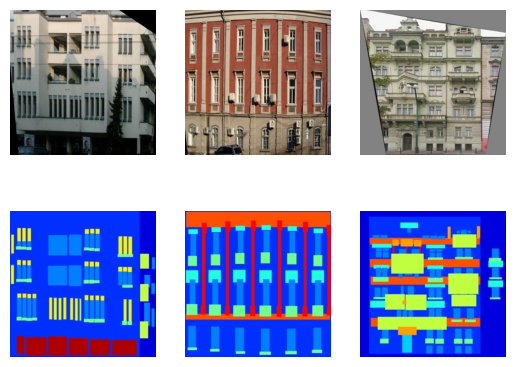

In [ ]:
n_samples = 3
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + i)
	pyplot.axis('off')
	pyplot.imshow(src_images[i].astype('uint8'))

for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + n_samples + i)
	pyplot.axis('off')
	pyplot.imshow(tar_images[i].astype('uint8'))
pyplot.show()

In [ ]:
data = [src_images, tar_images]

In [ ]:
image_shape = src_images.shape[1:]

d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
gan_model = define_gan(g_model, d_model, image_shape)

C:\Users\work\anaconda3\envs\gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
def preprocess_data(data): 
	src, trg = data[0], data[1]
	
	src = (src - 127.5) / 127.5
	trg = (trg - 127.5) / 127.5
	
	return [src, trg]

dataset = preprocess_data(data)

In [ ]:
n_epochs = 50

In [ ]:
import tensorflow as tf
tf.config.run_functions_eagerly(True) 

In [ ]:
from datetime import datetime 

start1 = datetime.now() 

train(d_model, g_model, gan_model, dataset, n_epochs=n_epochs, n_batch=16) 

stop1 = datetime.now()

execution_time = stop1-start1
print("Время обучения модели: ", execution_time, f"(\nОдна эпоха: {(execution_time/n_epochs).total_seconds()/60} минут)")

C:\Users\work\anaconda3\envs\gpu\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


Эпоха: 1
Итерация: 1, d1[0.432] d2[1.006] g[75.066]
Эпоха: 1
Итерация: 2, d1[0.471] d2[0.684] g[73.822]
Эпоха: 1
Итерация: 3, d1[0.418] d2[0.545] g[72.042]
Эпоха: 1
Итерация: 4, d1[0.382] d2[0.454] g[69.085]
Эпоха: 1
Итерация: 5, d1[0.438] d2[0.414] g[68.829]
Эпоха: 1
Итерация: 6, d1[0.390] d2[0.370] g[68.647]
Эпоха: 1
Итерация: 7, d1[0.360] d2[0.395] g[65.484]
Эпоха: 1
Итерация: 8, d1[0.379] d2[0.424] g[65.261]
Эпоха: 1
Итерация: 9, d1[0.403] d2[0.371] g[62.940]
Эпоха: 1
Итерация: 10, d1[0.387] d2[0.305] g[60.564]
Эпоха: 1
Итерация: 11, d1[0.374] d2[0.316] g[60.628]
Эпоха: 1
Итерация: 12, d1[0.325] d2[0.291] g[58.935]
Эпоха: 1
Итерация: 13, d1[0.328] d2[0.265] g[58.503]
Эпоха: 1
Итерация: 14, d1[0.347] d2[0.259] g[59.333]
Эпоха: 1
Итерация: 15, d1[0.281] d2[0.235] g[57.298]
Эпоха: 1
Итерация: 16, d1[0.239] d2[0.306] g[54.992]
Эпоха: 1
Итерация: 17, d1[0.201] d2[0.240] g[53.949]
Эпоха: 1
Итерация: 18, d1[0.210] d2[0.161] g[51.462]
Эпоха: 1
Итерация: 19, d1[0.196] d2[0.116] g[51.339]
Эп

In [ ]:
g_model.save(r'C:\Users\work\Downloads\models_task8_2\depth_model.h5')

### Демонстрация сгенерированных изображений:

In [ ]:
from keras.models import load_model
from numpy.random import randint

In [ ]:
model = load_model(r'C:\Users\work\Downloads\models_task8_2\depth_model.h5') 

In [ ]:
def plot_images(src_img, gen_img, tar_img):
	images = vstack((src_img, gen_img, tar_img))
	images = (images + 1) / 2.0
	titles = ['Исходное', 'Сгенерированное', 'Ожидаемое']
	for i in range(len(images)):
		pyplot.subplot(1, 3, 1 + i)
		pyplot.axis('off')
		pyplot.imshow(images[i])
		pyplot.title(titles[i])
	pyplot.show()

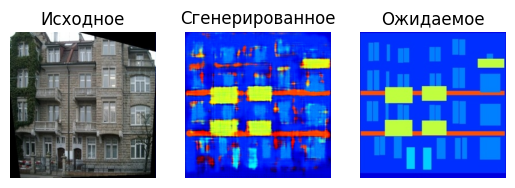

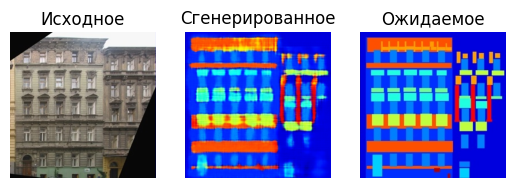

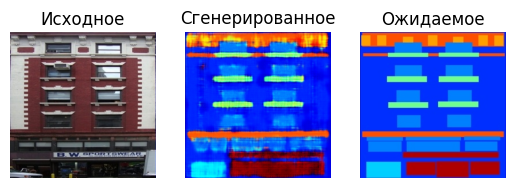

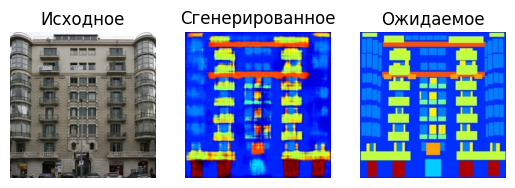

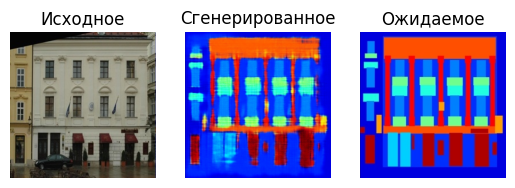

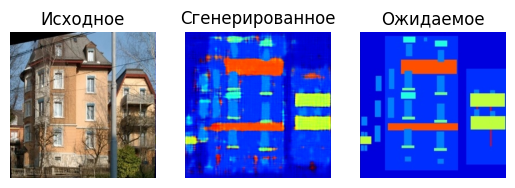

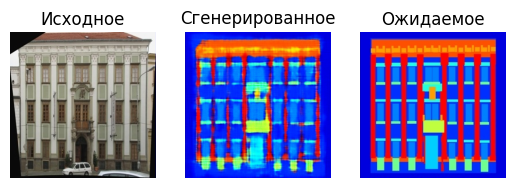

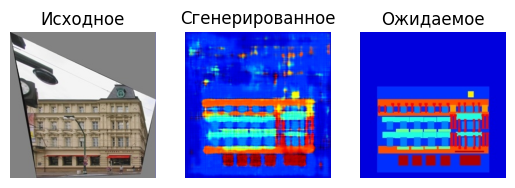

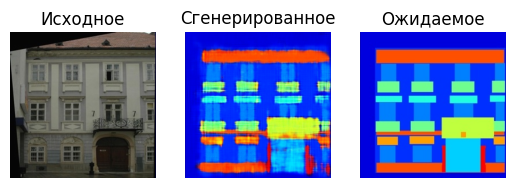

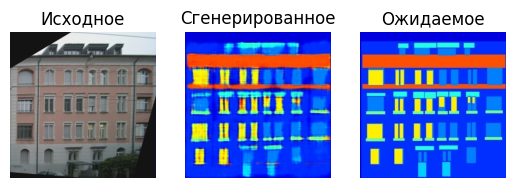

In [ ]:
[X1, X2] = dataset

for i in range(10):
  ix = randint(0, len(X1), 1)
  src_image, tar_image = X1[ix], X2[ix]
  gen_image = model.predict(src_image)
  plot_images(src_image, gen_image, tar_image)